In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/data/BreakoutDeterministic-v4-breakout-PER6-DQNDueling1-DuelingLoss1-seed1.zip /content

In [ ]:
!unzip BreakoutDeterministic-v4-breakout-PER6-DQNDueling1-DuelingLoss1-seed1.zip

Archive:  BreakoutDeterministic-v4-breakout-PER6-DQNDueling1-DuelingLoss1-seed1.zip
   creating: runs/
   creating: runs/BreakoutDeterministic-v4__breakout-PER6-DQNDueling1-DuelingLoss1__1__1734634123/
  inflating: runs/BreakoutDeterministic-v4__breakout-PER6-DQNDueling1-DuelingLoss1__1__1734634123/events.out.tfevents.1734634123.94418b925dc8.752.0  
  inflating: runs/BreakoutDeterministic-v4__breakout-PER6-DQNDueling1-DuelingLoss1__1__1734634123/breakout-PER6-DQNDueling1-DuelingLoss1.pth  
   creating: runs/BreakoutDeterministic-v4__breakout-PER2-DQNDueling1-DuelingLoss1__1__1734507422/
  inflating: runs/BreakoutDeterministic-v4__breakout-PER2-DQNDueling1-DuelingLoss1__1__1734507422/events.out.tfevents.1734507422.c01310cf6a8d.220.1  
  inflating: runs/BreakoutDeterministic-v4__breakout-PER2-DQNDueling1-DuelingLoss1__1__1734507422/breakout-PER2-DQNDueling1-DuelingLoss1.pth  
   creating: runs/BreakoutDeterministic-v4__breakout-PER1-DQNDueling1-DuelingLoss1__1__1734468073/
  inflating: r

In [ ]:
!pip install -q gymnasium[atari] ale_py tyro stable_baselines3 torchrl tensordict

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.9/359.9 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 958.1/958.1 kB 40.3 MB/s eta 0:00:00


In [ ]:
# docs and experiment results can be found at https://docs.cleanrl.dev/rl-algorithms/dqn/#dqn_ataripy
import os
import random
import time
from dataclasses import dataclass

import ale_py
import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from stable_baselines3.common.atari_wrappers import (
    ClipRewardEnv,
    EpisodicLifeEnv,
    FireResetEnv,
    MaxAndSkipEnv,
    NoopResetEnv,
)
from stable_baselines3.common.buffers import ReplayBuffer
from stable_baselines3.common.type_aliases import ReplayBufferSamples

from torch.utils.tensorboard import SummaryWriter

from typing import Callable

from tqdm.auto import tqdm

from torchrl.data import LazyTensorStorage, TensorDictPrioritizedReplayBuffer
from tensordict import TensorDict

import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
class ConvBackbone(nn.Sequential):
    """
    The convolutional part of a DQN model.
    Please, don't think about input scaling here: it will be implemented below.
    """
    def __init__(self, c_in: int) -> None:
        super().__init__(
            nn.Conv2d(in_channels=c_in, out_channels=32, kernel_size=8, stride=4),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1),
            nn.ReLU(),
            nn.Flatten(),
        )

class DuelingDqnHead(nn.Module):
    """
    Implenets the Dueling DQN logic.
    Please, don't think about gradient scaling here (if you know what it is about): it will be implemented below.
    """
    def __init__(self, n_actions, inp_size=64 * 7 * 7, hidden_size=512) -> None:
        super().__init__()
        self.adv_stream = nn.Sequential(
            nn.Linear(in_features=inp_size, out_features=hidden_size),
            nn.ReLU(),
            nn.Linear(in_features=hidden_size, out_features=n_actions),
        )

        self.value_stream = nn.Sequential(
            nn.Linear(in_features=inp_size, out_features=hidden_size),
            nn.ReLU(),
            nn.Linear(in_features=hidden_size, out_features=1),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        assert x.ndim == 2, x.shape  # (batch_size, n_features)

        action_value = self.adv_stream(x) # (batch_size, N_ACTIONS)
        state_value = self.value_stream(x) # (batch_size, 1)

        action_score_centered = action_value - action_value.mean(dim=-1, keepdim=True)

        q = state_value + action_score_centered
        return q

In [ ]:
MAX_UINT_8 = 2 ** 8 - 1


class InputScaler(nn.Module):
    def __init__(self, mult=1 / MAX_UINT_8):
        super().__init__()
        self.mult = mult

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return x * self.mult


class GradScalerFunctional(torch.autograd.Function):
    """
    A torch.autograd.Function works as Identity on forward pass
    and scales the gradient by scale_factor on backward pass.
    """
    @staticmethod
    def forward(ctx, input, scale_factor):
        ctx.scale_factor = scale_factor
        return input

    @staticmethod
    def backward(ctx, grad_output):
        scale_factor = ctx.scale_factor
        grad_input = grad_output * scale_factor
        return grad_input, None


class GradScaler(nn.Module):
    """
    An nn.Module incapsulating GradScalerFunctional
    """
    def __init__(self, scale_factor: float):
        super().__init__()
        self.scale_factor = scale_factor

    def forward(self, x):
        return GradScalerFunctional.apply(x, self.scale_factor)

In [ ]:
# ALGO LOGIC: initialize agent here:
class DQNetwork(nn.Module):
    def __init__(self, env):
        super().__init__()
        self.network = nn.Sequential(
            InputScaler(), # the inputs come from the uint8 range
            ConvBackbone(c_in=4),
            nn.Linear(3136, 512),
            nn.ReLU(),
            nn.Linear(512, env.single_action_space.n),
        )

    def forward(self, x):
        return self.network(x)

class DQNetworkDueling(nn.Module):
    def __init__(self, env) -> None:
        super().__init__()
        self.network = nn.Sequential(
            InputScaler(), # the inputs come from the uint8 range
            ConvBackbone(c_in=4),
            GradScaler(1 / 2**0.5), # Dueling DQN suggests do scale the gradient by 1 / sqrt(2)
            DuelingDqnHead(n_actions=env.single_action_space.n)
        )

    def forward(self, x):
        return self.network(x)

# Loss

In [ ]:
# @title Test Loss Function
import torch
import torch.nn as nn
from typing import Protocol


class ComputeTdLossProtocol(Protocol):
    """
    An Protocol which the compute_td_loss function should match.
    """

    def __call__(
        self,
        states: torch.Tensor,
        actions: torch.Tensor,
        rewards: torch.Tensor,
        next_states: torch.Tensor,
        is_done: torch.Tensor,
        agent: nn.Module,
        target_network: nn.Module,
        gamma: float,
    ):
        pass


class MockAgent(nn.Module):
    """
    An nn.Module, which outputs a value which does not depend on its input.
    Designed to be used for testing the compute_td_loss function.
    """

    def __init__(self, output_q_values: torch.Tensor):
        super().__init__()
        assert output_q_values.dtype == torch.float, output_q_values.dtype
        assert output_q_values.ndim == 2, output_q_values.shape
        self.output_q_values = nn.Parameter(output_q_values)

    def forward(self, state):
        return torch.clone(self.output_q_values)


@torch.no_grad()
def test_is_done_is_used(compute_td_loss: ComputeTdLossProtocol):
    """
    Tries to catch the error when compute_td_loss ignores its is_done argument.
    """

    states = torch.empty(1)
    actions = torch.tensor([0])
    rewards = torch.tensor([1], dtype=torch.float)
    is_done_first = torch.tensor([True], dtype=torch.float)
    is_done_second = torch.tensor([False], dtype=torch.float)
    next_states = torch.empty(1)
    gamma = 0.99

    q_values_agent = torch.tensor([[1, 1, 1]], dtype=torch.float)
    q_values_target_network = torch.tensor([[1, 1, 1]], dtype=torch.float)
    agent = MockAgent(q_values_agent)
    target_network = MockAgent(q_values_target_network)

    loss_kwargs = dict(
        q_network=agent,
        target_network=target_network,
        gamma=gamma,
    )

    data_first = ReplayBufferSamples(
        observations=states,
        actions=actions,
        next_observations=next_states,
        dones=is_done_first,
        rewards=rewards,
    )

    data_second = ReplayBufferSamples(
        observations=states,
        actions=actions,
        next_observations=next_states,
        dones=is_done_second,
        rewards=rewards,
    )

    loss_first = compute_td_loss(data=data_first, **loss_kwargs).item()
    loss_second = compute_td_loss(data=data_second, **loss_kwargs).item()

    abs_diff = abs(loss_first - loss_second)
    if abs_diff > 0.5:
        msg = "compute_td_loss returned close values for different is_done inputs"

    assert abs(loss_first - loss_second) > 0.5, msg


@torch.no_grad()
def test_compute_td_loss_vanilla(compute_td_loss: ComputeTdLossProtocol):
    """
    Checks compute_td_loss on manually precomputed examples.
    Note: this is a test for vanilla compute_td_loss
    and it should NOT be used for double_dqn
    """

    samples = [
        {
            "q_agent": [0, 1, 2],
            "action": 1,
            "is_done": False,
            "q_target": [0, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 25,
        },
        {
            "q_agent": [0, 1, 2],
            "action": 1,
            "is_done": False,
            "q_target": [2, 0, 1],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 25,
        },
        {
            "q_agent": [3, 1, 2],
            "action": 1,
            "is_done": True,
            "q_target": [0, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 16,
        },
        {
            "q_agent": [0, 1, 2],
            "action": 0,
            "is_done": False,
            "q_target": [0, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 36,
        },
    ]

    for sample in samples:
        agent = MockAgent(torch.tensor(sample["q_agent"], dtype=torch.float)[None])
        tn = MockAgent(torch.tensor(sample["q_target"], dtype=torch.float)[None])
        data = ReplayBufferSamples(
            observations=torch.empty(1).reshape(1, -1),
            actions=torch.tensor(sample["action"]).reshape(1, -1),
            next_observations=torch.empty(1).reshape(1, -1),
            dones=torch.tensor(sample["is_done"], dtype=torch.float).reshape(1, -1),
            rewards=torch.tensor(sample["reward"]).reshape(1, -1),
        )
        ans = compute_td_loss(
            data=data,
            q_network=agent,
            target_network=tn,
            weights=torch.tensor([sample["weights"]]),
            gamma=sample["gamma"],
        )[0].item()
        abs_diff = abs(ans - sample["answer"])
        assert abs_diff < 1e-8, abs_diff


@torch.no_grad()
def test_compute_td_loss_double(compute_td_loss: ComputeTdLossProtocol):
    """
    Checks compute_td_loss on manually precomputed examples.
    Note: this is a test for vanilla compute_td_loss
    and it should NOT be used for double_dqn
    """

    samples = [
        {
            "q_agent": [0, 1, 2],
            "action": 1,
            "is_done": False,
            "q_target": [0, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 25,
        },
        {
            "q_agent": [0, 1, 2],
            "action": 1,
            "is_done": False,
            "q_target": [2, 0, 1],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 20.25,
        },
        {
            "q_agent": [3, 1, 2],
            "action": 1,
            "is_done": False,
            "q_target": [-1, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 12.25,
        },
        {
            "q_agent": [3, 1, 2],
            "action": 1,
            "is_done": True,
            "q_target": [-1, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 16,
        },
        {
            "q_agent": [0, 1, 2],
            "action": 0,
            "is_done": False,
            "q_target": [0, 1, 2],
            "weights": 1,
            "gamma": 0.5,
            "reward": 5,
            "answer": 36,
        },
    ]

    for sample in samples:
        agent = MockAgent(torch.tensor(sample["q_agent"], dtype=torch.float)[None])
        tn = MockAgent(torch.tensor(sample["q_target"], dtype=torch.float)[None])
        data = ReplayBufferSamples(
            observations=torch.empty(1).reshape(1, -1),
            actions=torch.tensor(sample["action"]).reshape(1, -1),
            next_observations=torch.empty(1).reshape(1, -1),
            dones=torch.tensor(sample["is_done"], dtype=torch.float).reshape(1, -1),
            rewards=torch.tensor(sample["reward"]).reshape(1, -1),
        )
        ans = compute_td_loss(
            data=data,
            q_network=agent,
            target_network=tn,
            weights=torch.tensor([sample["weights"]]),
            gamma=sample["gamma"],
        )[0].item()
        abs_diff = abs(ans - sample["answer"])
        assert abs_diff < 1e-8, abs_diff

In [ ]:
def compute_td_loss_on_tensors(
    data: ReplayBufferSamples,
    q_network: nn.Module,
    target_network: nn.Module,
    weights: torch.Tensor,
    gamma: float = 0.99,
    check_shapes: bool = False,
):
    """
    data.rewards & data.dones & data.dones: [B, 1]
    data.next_observations & data.observations: [B, *obs_shape]
    """
    assert data.dones.dtype is torch.float32

    with torch.no_grad():
        predicted_next_qvalues = target_network(data.next_observations)  # shape: [B, n_actions]
        next_state_values = predicted_next_qvalues.max(dim=1)[0] # shape: [B]

        if check_shapes:
            assert (
                next_state_values.dim() == 1
                and next_state_values.shape[0] == data.observations.shape[0]
            ), "must predict one value per state"
            assert not next_state_values.requires_grad

        target_qvalues_for_actions = data.rewards.flatten() + gamma * next_state_values * (1 - data.dones.flatten())

    predicted_qvalues = q_network(data.observations)  # shape: [B, n_actions]
    predicted_qvalues_for_actions = predicted_qvalues.gather(1, data.actions).squeeze(-1) # shape: [B]

    td_errors = target_qvalues_for_actions - predicted_qvalues_for_actions

    assert (
        weights.dim() == 1
        and weights.shape[0] == td_errors.shape[0]
    ), 'weights parameter has incorrect shape'

    loss = torch.mean(weights * td_errors ** 2)

    avg_qvalues = predicted_qvalues_for_actions.mean().item()

    if check_shapes:
        assert (
            predicted_next_qvalues.data.dim() == 2
        ), "make sure you predicted q-values for all actions in next state"
        assert (
            next_state_values.data.dim() == 1
        ), "make sure you computed V(s') as maximum over just the actions axis and not all axes"
        assert (
            target_qvalues_for_actions.data.dim() == 1
        ), "there's something wrong with target q-values, they must be a vector"

    return loss, td_errors.detach().cpu().numpy(), avg_qvalues


test_compute_td_loss_vanilla(compute_td_loss_on_tensors)
print("Well done!")

Well done!


In [ ]:
def compute_td_loss_on_tensors_double(
    data: ReplayBufferSamples,
    q_network: nn.Module,
    target_network: nn.Module,
    weights: torch.Tensor,
    gamma: float = 0.99,
    check_shapes = False,
):
    """
    data.rewards & data.dones & data.dones: [B, 1]
    data.next_observations & data.observations: [B, *obs_shape]
    """
    assert data.dones.dtype is torch.float32

    with torch.no_grad():
        predicted_next_qvalues_agent = q_network(data.next_observations) # shape: [batch_size, n_actions]
        best_actions = predicted_next_qvalues_agent.argmax(dim=1, keepdim=True) # shape: [batch_size, 1]

        predicted_next_qvalues_target = target_network(data.next_observations)  # shape: [batch_size, n_actions]
        next_state_values = predicted_next_qvalues_target.gather(1, best_actions).squeeze(-1) # shape: [batch_size]

        if check_shapes:
            assert (
                next_state_values.dim() == 1
                and next_state_values.shape[0] == data.observations.shape[0]
            ), "must predict one value per state"
            assert not next_state_values.requires_grad

        target_qvalues_for_actions = data.rewards.flatten() + gamma * next_state_values * (1 - data.dones.flatten())

    predicted_qvalues = q_network(data.observations) # shape: [batch_size, n_actions]
    predicted_qvalues_for_actions = predicted_qvalues.gather(1, data.actions).squeeze(-1) # shape: [batch_size]

    td_errors = target_qvalues_for_actions - predicted_qvalues_for_actions

    assert (
        weights.dim() == 1
        and weights.shape[0] == td_errors.shape[0]
    ), 'weights parameter has incorrect shape'

    loss = torch.mean(weights * td_errors ** 2)

    avg_qvalues = predicted_qvalues_for_actions.mean().item()

    if check_shapes:
        assert (
            predicted_next_qvalues_target.data.dim() == 2
        ), "make sure you predicted q-values for all actions in next state"
        assert (
            next_state_values.data.dim() == 1
        ), "make sure you computed V(s') as maximum over just the actions axis and not all axes"
        assert (
            target_qvalues_for_actions.data.dim() == 1
        ), "there's something wrong with target q-values, they must be a vector"

    return loss, td_errors.detach().cpu().numpy(), avg_qvalues

test_compute_td_loss_double(compute_td_loss_on_tensors_double)
print("Well done!")

Well done!


# Evaluation

In [ ]:
def findLocalMaxima(arr):
    n = len(arr)
    mx = []

    if(arr[0] > arr[1]):
        mx.append(0)

    for i in range(1, n-1):
        if(arr[i-1] < arr[i] > arr[i + 1]):
            mx.append(i)

    if(arr[-1] > arr[-2]):
        mx.append(n-1)

    return mx

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def evaluate(
    model_path: str,
    make_env: Callable,
    env_id: str,
    eval_episodes: int,
    run_name: str,
    Model: torch.nn.Module,
    device: torch.device = torch.device("cpu"),
    epsilon: float = 0.05,
    capture_video: bool = True,
    plot_q_values: bool = False,
):
    envs = gym.vector.SyncVectorEnv([make_env(env_id, 0, 0, capture_video, run_name)])
    model = Model(envs).to(device)
    checkpoint = torch.load(model_path, weights_only=True, map_location=device)
    model.load_state_dict(checkpoint['q_network'])
    model.eval()

    obs, _ = envs.reset()
    episodic_returns = []
    episodic_lengths = []

    qs = []
    frames = [envs.render()[0]]

    with tqdm(desc='Evaluating', leave=False, total=eval_episodes * envs.num_envs) as eval_tqdm:

        while len(episodic_returns) < eval_episodes:

            if random.random() < epsilon:
                actions = np.array([envs.single_action_space.sample() for _ in range(envs.num_envs)])
            else:
                q_values = model(torch.Tensor(obs).to(device))
                actions = torch.argmax(q_values, dim=1)

                if plot_q_values:
                    qs.append(q_values.gather(1, actions.reshape(-1, 1)).item())

                actions = actions.cpu().numpy()

            next_obs, _, _, _, infos = envs.step(actions)

            if plot_q_values:
                frames.append(envs.render()[0])

            if infos and "episode" in infos:
                episodic_returns.append(infos["episode"]["r"][0]) # zero in case of single env
                episodic_lengths.append(infos["episode"]["l"][0])
                eval_tqdm.update(1)

            obs = next_obs

    if plot_q_values:
        max_indices = findLocalMaxima(qs)
        frames_count = 5
        max_indices = random.sample(max_indices, frames_count)
        max_indices.sort()
        print(f"{len(max_indices)=}")

        plt.plot(qs)
        plt.scatter(max_indices, [qs[i] for i in max_indices], c='red')
        plt.xlabel('frame')
        plt.ylabel('q')
        plt.show()

        fig, ax = plt.subplots(1, frames_count, figsize=(10, 5))
        for i in range(frames_count):
          # print(f"{frames[max_indices[i]].shape=}")
          ax[i].imshow(frames[max_indices[i]])
        plt.show()

    return episodic_returns, episodic_lengths

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
@dataclass
class Args:
    exp_name: str = 'breakout-PER6-DQNDueling1-DuelingLoss1'
    """the name of this experiment"""

    seed: int = 1
    """seed of the experiment"""

    torch_deterministic: bool = True
    """if toggled, `torch.backends.cudnn.deterministic=False`"""

    cuda: bool = True
    """if toggled, cuda will be enabled by default"""

    capture_video: bool = False
    """whether to capture videos of the agent performances (check out `videos` folder)"""

    # Algorithm specific arguments
    env_id: str = "BreakoutDeterministic-v4"
    """the id of the environment"""

    total_timesteps: int = 10**7
    """total timesteps of the experiments"""

    learning_rate: float = 1e-4 #  6.25*1e−5
    """the learning rate of the optimizer"""

    num_envs: int = 1
    """the number of parallel game environments"""

    buffer_size: int = 1 * 10**5 # 1000000
    """the replay memory buffer size"""

    gamma: float = 0.99
    """the discount factor gamma"""

    tau: float = 1.0
    """the target network update rate"""

    target_network_frequency: int = 10000 # 1000
    """the timesteps it takes to update the target network"""

    save_frequency: int = 5000 # 5000
    """the frequency of saving into the `runs/{run_name}` folder"""

    batch_size: int = 32
    """the batch size of sample from the reply memory"""

    start_e: float = 1
    """the starting epsilon for exploration"""

    end_e: float = 0.01
    """the ending epsilon for exploration"""

    exploration_fraction: float = 0.10
    """the fraction of `total-timesteps` it takes from start-e to go end-e"""

    learning_starts: int = 8000 # 80000
    """timestep to start learning"""

    train_frequency: int = 4
    """the frequency of training"""

    max_grad_norm: int = 10
    """clip the gradients to have their norm less than or equal to 10"""

    use_prioritized_replay: bool = True

    prioritized_replay_eps: float = 1e-6

    initial_alpha: float = 0.7

    initial_beta: float = 0.5

    final_beta: float = 1.0

    load_checkpoint: str = '/content/runs/BreakoutDeterministic-v4__breakout-PER5-DQNDueling1-DuelingLoss1__1__1734595621/breakout-PER5-DQNDueling1-DuelingLoss1.pth'

In [ ]:
!rm -rf /content/runs/BreakoutDeterministic-v4__breakout-PER3-DQNDueling1-DuelingLoss1__1__1734519235

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
!rm -rf runs
!mkdir runs

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
def make_env(env_id, seed, idx, capture_video, run_name):
    def thunk():
        if capture_video and idx == 0:
            env = gym.make(env_id, render_mode="rgb_array")
            env = gym.wrappers.RecordVideo(env, f"videos/{run_name}")
        else:
            env = gym.make(env_id)

        env = NoopResetEnv(env, noop_max=30)
        env = MaxAndSkipEnv(env, skip=4)
        env = EpisodicLifeEnv(env)
        if "FIRE" in env.unwrapped.get_action_meanings():
            env = FireResetEnv(env)
        env = ClipRewardEnv(env)
        env = gym.wrappers.RecordEpisodeStatistics(env)
        env = gym.wrappers.ResizeObservation(env, (84, 84))
        env = gym.wrappers.GrayscaleObservation(env)
        env = gym.wrappers.FrameStackObservation(env, 4)

        env.action_space.seed(seed)
        return env

    return thunk


def linear_schedule(start_e: float, end_e: float, duration: int, t: int):
    slope = (end_e - start_e) / duration
    return max(slope * t + start_e, end_e)

In [ ]:
if __name__ == "__main__":
    import stable_baselines3 as sb3

    if sb3.__version__ < "2.0":
        raise ValueError("""
            Ongoing migration: run the following command to install the new dependencies:
            poetry run pip install "stable_baselines3==2.0.0a1" "gymnasium[atari,accept-rom-license]==0.28.1"  "ale-py==0.8.1"
            """)

    args = Args()
    print(args)

    assert args.num_envs == 1, "vectorized envs are not supported at the moment"
    run_name = f"{args.env_id}__{args.exp_name}__{args.seed}__{int(time.time())}"

    writer = SummaryWriter(f"runs/{run_name}")
    writer.add_text(
        "hyperparameters",
        "|param|value|\n|-|-|\n%s" % ("\n".join([f"|{key}|{value}|" for key, value in vars(args).items()])),
    )

    # TRY NOT TO MODIFY: seeding
    random.seed(args.seed)
    np.random.seed(args.seed)
    torch.manual_seed(args.seed)
    torch.backends.cudnn.deterministic = args.torch_deterministic

    device = torch.device("cuda" if torch.cuda.is_available() and args.cuda else "cpu")

    # env setup
    envs = gym.vector.SyncVectorEnv(
        [make_env(args.env_id, args.seed + i, i, args.capture_video, run_name) for i in range(args.num_envs)]
    )
    assert isinstance(envs.single_action_space, gym.spaces.Discrete), "only discrete action space is supported"

    q_network = DQNetworkDueling(envs).to(device)
    step = 0

    if args.load_checkpoint is not None:
        checkpoint = torch.load(args.load_checkpoint, weights_only=True, map_location=device)
        q_network.load_state_dict(checkpoint['q_network'])
        step = checkpoint['step']

    print(f"Starting from step {step}")

    optimizer = optim.Adam(q_network.parameters(), lr=args.learning_rate)
    target_network = DQNetworkDueling(envs).to(device)
    target_network.load_state_dict(q_network.state_dict())
    loss_fn = compute_td_loss_on_tensors_double if isinstance(q_network, DQNetworkDueling) else compute_td_loss_on_tensors

    if args.use_prioritized_replay:
        rb = TensorDictPrioritizedReplayBuffer(
            alpha=args.initial_alpha,
            beta=args.initial_beta,
            storage=LazyTensorStorage(args.buffer_size),
            batch_size=args.batch_size
        )
    else:
        rb = ReplayBuffer(
            args.buffer_size,
            envs.single_observation_space,
            envs.single_action_space,
            device,
            args.num_envs,
            optimize_memory_usage=True,
            handle_timeout_termination=False,
        )

    start_time = time.time()

    # TRY NOT TO MODIFY: start the game
    obs, _ = envs.reset(seed=args.seed)
    for global_step in tqdm(range(step, args.total_timesteps)):
        # if global_step == 1000: break

        # ALGO LOGIC: put action logic here
        epsilon = linear_schedule(args.start_e, args.end_e, args.exploration_fraction * args.total_timesteps, global_step)
        if random.random() < epsilon:
            actions = np.array([envs.single_action_space.sample() for _ in range(envs.num_envs)])
        else:
            q_values = q_network(torch.Tensor(obs).to(device))
            actions = torch.argmax(q_values, dim=1).cpu().numpy()

        # TRY NOT TO MODIFY: execute the game and log data.
        next_obs, rewards, terminations, truncations, infos = envs.step(actions)

        # TRY NOT TO MODIFY: record rewards for plotting purposes
        # if infos and "episode" in infos:
        #     writer.add_scalar("charts/episodic_return", infos["episode"]["r"][0], global_step)
        #     writer.add_scalar("charts/episodic_length", infos["episode"]["l"][0], global_step)

        # TRY NOT TO MODIFY: save data to reply buffer; handle `final_observation`
        # real_next_obs = next_obs.copy()
        # for idx, trunc in enumerate(truncations):
        #     if trunc:
        #         real_next_obs[idx] = infos["final_observation"][idx]

        if args.use_prioritized_replay:
            td = TensorDict(
                {"obs": torch.tensor(obs),
                 "next_obs": torch.tensor(next_obs),
                 "actions": torch.tensor(actions).reshape(-1, 1),
                 "rewards": torch.tensor(rewards, dtype=torch.float32),
                 "dones": torch.tensor(terminations, dtype=torch.float32)},
                batch_size=[args.num_envs],
            )
            rb.extend(td)
        else:
            rb.add(obs, next_obs, actions, rewards, terminations, infos)

        # TRY NOT TO MODIFY: CRUCIAL step easy to overlook
        obs = next_obs

        # ALGO LOGIC: training.
        if global_step > args.learning_starts:
            if global_step % args.train_frequency == 0:

                if args.use_prioritized_replay:
                    rb.beta = linear_schedule(args.initial_beta, args.final_beta, global_step, args.total_timesteps)

                    data = rb.sample(args.batch_size)
                    sample = ReplayBufferSamples(
                        observations=data['obs'],
                        actions=data['actions'],
                        next_observations=data['next_obs'],
                        dones=data['dones'],
                        rewards=data['rewards'],
                    )

                    loss, td_errors, avg_qvalues = loss_fn(sample, q_network, target_network, weights=data['_weight'])
                    new_priorities = np.abs(td_errors) + args.prioritized_replay_eps
                    rb.update_priority(data['index'], new_priorities)
                else:
                    data = rb.sample(args.batch_size)
                    weights = torch.ones(args.batch_size, dtype=torch.float32)
                    loss, _, avg_qvalues = loss_fn(data, q_network, target_network, weights=weights)

                if global_step % 100 == 0:
                    writer.add_scalar("losses/td_loss", loss, global_step)
                    writer.add_scalar("losses/q_values", avg_qvalues, global_step)
                    writer.add_scalar("charts/SPS", int(global_step / (time.time() - start_time)), global_step)

                optimizer.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(q_network.parameters(), args.max_grad_norm)
                optimizer.step()

            if global_step % args.target_network_frequency == 0:
                for target_network_param, q_network_param in zip(target_network.parameters(), q_network.parameters()):
                    target_network_param.data.copy_(
                        args.tau * q_network_param.data + (1.0 - args.tau) * target_network_param.data
                    )

            if global_step % args.save_frequency == 0:
                model_path = f"runs/{run_name}/{args.exp_name}.pth"
                torch.save({'step': global_step,
                            'q_network': q_network.state_dict()}, model_path)

                episodic_returns, episodic_lengths = evaluate(
                    model_path,
                    make_env,
                    args.env_id,
                    eval_episodes=10,
                    run_name=f"{run_name}-eval",
                    Model=DQNetworkDueling,
                    device=device,
                    epsilon=0.05,
                    capture_video=args.capture_video
                )
                writer.add_scalar("eval/mean_reward_per_life", np.mean(episodic_returns), global_step)
                writer.add_scalar("eval/mean_episodic_lengths", np.mean(episodic_lengths), global_step)

                repo_name = f"{args.env_id}-{args.exp_name}-seed{args.seed}"
                os.system(f"zip -r {repo_name}.zip runs")
                os.system(f"cp {repo_name}.zip /content/drive/MyDrive/data")

    envs.close()
    writer.close()

Args(exp_name='breakout-PER6-DQNDueling1-DuelingLoss1', seed=1, torch_deterministic=True, cuda=True, capture_video=False, env_id='BreakoutDeterministic-v4', total_timesteps=10000000, learning_rate=0.0001, num_envs=1, buffer_size=100000, gamma=0.99, tau=1.0, target_network_frequency=10000, save_frequency=5000, batch_size=32, start_e=1, end_e=0.01, exploration_fraction=0.1, learning_starts=8000, train_frequency=4, max_grad_norm=10, use_prioritized_replay=True, prioritized_replay_eps=1e-06, initial_alpha=0.7, initial_beta=0.5, final_beta=1.0, load_checkpoint='/content/runs/BreakoutDeterministic-v4__breakout-PER5-DQNDueling1-DuelingLoss1__1__1734595621/breakout-PER5-DQNDueling1-DuelingLoss1.pth')
Starting from step 1520000


  0%|          | 0/8480000 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def show_video(path):
    mp4 = open(path,'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML(f"""
    <video width=400 controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """)

/usr/local/lib/python3.10/dist-packages/gymnasium/wrappers/rendering.py:283: UserWarning: WARN: Overwriting existing videos at /content/videos/PER6-eval folder (try specifying a different `video_folder` for the `RecordVideo` wrapper if this is not desired)
  logger.warn(


Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

len(max_indices)=5


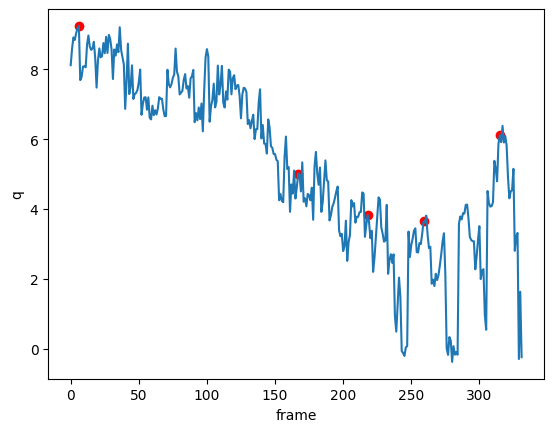

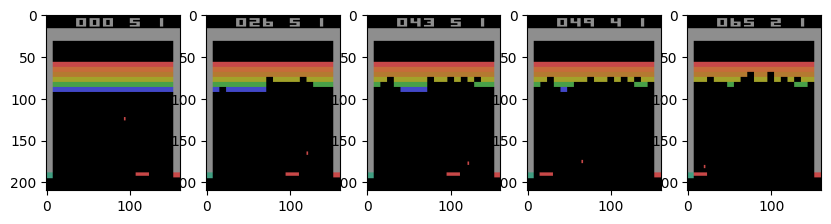

([34.0, 3.0, 0.0, 4.0, 5.0], [257, 32, 3, 21, 27])

In [ ]:
evaluate(
    "/content/runs/BreakoutDeterministic-v4__breakout-PER6-DQNDueling1-DuelingLoss1__1__1734634123/breakout-PER6-DQNDueling1-DuelingLoss1.pth",
    make_env,
    "BreakoutDeterministic-v4",
    eval_episodes=5,
    run_name="PER6-eval",
    Model=DQNetworkDueling,
    plot_q_values=True,
)

In [ ]:
show_video('/content/videos/PER6-eval/rl-video-episode-0.mp4')

In [ ]:
mp4 = open('/content/videos/PER6-eval/rl-video-episode-0.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
